In [2]:
import numpy as np
import pandas as pd
import seaborn as sns
sns.set()
import matplotlib.pyplot as plt
import plotly.express as px

import os
import json
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

# mapas interactivos
import folium
from folium.plugins import FastMarkerCluster
import geopandas as gpd
from branca.colormap import LinearColormap

#to make the plotly graphs
import plotly.graph_objs as go
import chart_studio.plotly as py
from plotly.offline import iplot, init_notebook_mode
import cufflinks
cufflinks.go_offline(connected=True)
init_notebook_mode(connected=True)

#text mining
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
import re
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from wordcloud import WordCloud

In [3]:
listings = pd.read_csv(r"C:\Users\34650\Desktop\BOOTCAMP_CURSO\Temario\MODULO 2\PROYECTO MODULO 2\input\listings.csv", index_col= "id")
listings_details = pd.read_csv(r"C:\Users\34650\Desktop\BOOTCAMP_CURSO\Temario\MODULO 2\PROYECTO MODULO 2\input\listings.csv.gz", index_col= "id", low_memory=False)

calendar = pd.read_csv(r"C:\Users\34650\Desktop\BOOTCAMP_CURSO\Temario\MODULO 2\PROYECTO MODULO 2\input\calendar.csv.gz", parse_dates=['date'], index_col=['listing_id'])
reviews_details = pd.read_csv(r"C:\Users\34650\Desktop\BOOTCAMP_CURSO\Temario\MODULO 2\PROYECTO MODULO 2\input\reviews.csv.gz", parse_dates=['date'])
reviews =  pd.read_csv(r"C:\Users\34650\Desktop\BOOTCAMP_CURSO\Temario\MODULO 2\PROYECTO MODULO 2\input\reviews.csv", parse_dates=['date'])

In [4]:
conversion_rate = 0.0010

# Convierte los precios de dólares a euros
listings['price'] = listings['price'] * conversion_rate

In [5]:
listings

,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
id,,,,,,,,,,,,,,,,,
49392,Rental unit in Santiago · 1 bedroom · 1 bed,224592,Maria,NaN,Providencia,-33.432770,-70.598920,Private room,47.232,3,0,NaN,NaN,1,178,0,NaN
52811,Rental unit in Providencia · ★4.42 · 1 bedroom...,244792,Cristián,NaN,Providencia,-33.429590,-70.618800,Entire home/apt,48.123,1,46,2021-11-04,0.29,3,0,0,NaN
53494,Rental unit in Santiago · ★4.76 · 2 bedrooms ·...,249097,Paulina,NaN,Lo Barnechea,-33.345210,-70.295430,Entire home/apt,149.999,2,38,2021-05-22,0.43,1,357,0,NaN
65058,Rental unit in Santiago · 1 bedroom · 1 bed · ...,318016,Patricio,NaN,Recoleta,-33.430490,-70.640790,Private room,53.470,2,0,NaN,NaN,1,0,0,NaN
73752,Rental unit in Santiago · 1 bedroom · 1 bed · ...,374124,Daniela&Ricardo,NaN,Santiago,-33.438650,-70.642410,Private room,71.294,3,0,NaN,NaN,1,0,0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
985454221337334276,Condo in Ñuñoa · ★New · 1 bedroom · 2 beds · 1...,1434751,Celia,NaN,Ñuñoa,-33.464356,-70.625435,Entire home/apt,44.958,10,0,NaN,NaN,2,88,0,NaN
985460635695393707,Rental unit in Las Condes · ★New · 1 bedroom ·...,537305752,Marcelo,NaN,Las Condes,-33.407773,-70.559417,Entire home/apt,50.520,1,0,NaN,NaN,1,359,0,NaN
985495018539241667,Rental unit in Santiago · ★New · 1 bedroom · 2...,538246242,Valentina,NaN,Santiago,-33.437960,-70.644980,Entire home/apt,33.257,2,0,NaN,NaN,1,364,0,NaN


In [6]:
listings_details

,listing_url,scrape_id,last_scraped,source,name,description,neighborhood_overview,picture_url,host_id,host_url,...,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
id,,,,,,,,,,,,,,,,,,,,,
7947273,https://www.airbnb.com/rooms/7947273,20230922223348,2023-09-23,previous scrape,Rental unit in Recoleta · 2 bedrooms · 2 beds ...,Acogedor departamento amoblado en el mejor sec...,NaN,https://a0.muscache.com/pictures/101256508/9bd...,41839181,https://www.airbnb.com/users/show/41839181,...,NaN,NaN,NaN,NaN,f,2,2,0,0,NaN
26541340,https://www.airbnb.com/rooms/26541340,20230922223348,2023-09-23,previous scrape,Rental unit in Santiago · 2 bedrooms · 3 beds ...,NaN,NaN,https://a0.muscache.com/pictures/miso/Hosting-...,51966337,https://www.airbnb.com/users/show/51966337,...,1.00,4.00,2.00,NaN,f,16,11,4,1,0.05
350681,https://www.airbnb.com/rooms/350681,20230922223348,2023-09-23,previous scrape,Home in Santiago · 1 bedroom · 2 beds · 1.5 baths,"<b>The space</b><br />1 room with bathroom, ou...",NaN,https://a0.muscache.com/pictures/3989119/95581...,1777356,https://www.airbnb.com/users/show/1777356,...,NaN,NaN,NaN,NaN,f,1,0,1,0,NaN
40897730,https://www.airbnb.com/rooms/40897730,20230922223348,2023-09-23,city scrape,Condo in Santiago · ★4.60 · 1 bedroom · 1 bed ...,Brand new modern apartment (finished in 2019) ...,Located in the quiet residential barrio of Ñuñ...,https://a0.muscache.com/pictures/a3435f69-83d1...,16202450,https://www.airbnb.com/users/show/16202450,...,4.00,4.40,4.40,NaN,t,1,1,0,0,0.56
14262845,https://www.airbnb.com/rooms/14262845,20230922223348,2023-09-23,city scrape,Rental unit in Santiago · ★4.64 · 1 bedroom · ...,"Lugares de interés: vida nocturna, actividades...",Barrio tranquilo residencial y universitario. ...,https://a0.muscache.com/pictures/bcfa036d-6fc1...,64344066,https://www.airbnb.com/users/show/64344066,...,4.79,4.58,4.72,NaN,t,1,1,0,0,1.28
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
776012080227043725,https://www.airbnb.com/rooms/776012080227043725,20230922223348,2023-09-23,city scrape,Home in La Cisterna · ★5.0 · 1 bedroom · 1 bed...,Relájate con toda la familia en este alojamien...,Lugar tranquilo vecinos de poca bulla,https://a0.muscache.com/pictures/07bdf133-744e...,413908587,https://www.airbnb.com/users/show/413908587,...,5.00,4.67,5.00,NaN,t,1,0,1,0,0.31
603601346966217161,https://www.airbnb.com/rooms/603601346966217161,20230922223348,2023-09-23,city scrape,Guesthouse in Independencia · 1 bedroom · 1 be...,Disfruta de la sencillez de este alojamiento t...,Ambiente MUY tranquilo y seguro,https://a0.muscache.com/pictures/8e44f171-0cee...,440808321,https://www.airbnb.com/users/show/440808321,...,NaN,NaN,NaN,NaN,t,1,0,0,1,NaN
18804940,https://www.airbnb.com/rooms/18804940,20230922223348,2023-09-23,city scrape,Rental unit in San Miguel · 1 bedroom · 1 bed ...,"Está cerca de Supermercados, restaurantes y en...",NaN,https://a0.muscache.com/pictures/a5b5a2d5-ba6d...,130910125,https://www.airbnb.com/users/show/130910125,...,NaN,NaN,NaN,NaN,f,1,0,1,0,NaN


In [7]:
calendar.price = calendar.price.str.replace(",","")
calendar['price'] = pd.to_numeric(calendar['price'].str.strip('$'))
calendar = calendar[calendar.date < '2024-09-21']

In [8]:
calendar = calendar.drop('adjusted_price', axis=1)

In [9]:
# Convierte los precios de dólares a euros
calendar['price'] = calendar['price'] *100

In [10]:
calendar

,date,available,price,minimum_nights,maximum_nights
listing_id,,,,,
49392,2023-09-23,f,4277600.0,3.0,730.0
49392,2023-09-24,t,4901400.0,3.0,730.0
49392,2023-09-25,t,4901400.0,3.0,730.0
49392,2023-09-26,t,4901400.0,3.0,730.0
49392,2023-09-27,t,4901400.0,3.0,730.0
...,...,...,...,...,...
985660815267811587,2024-09-16,f,3800000.0,1.0,365.0
985660815267811587,2024-09-17,f,3800000.0,1.0,365.0
985660815267811587,2024-09-18,f,3800000.0,1.0,365.0


In [11]:
reviews_details

,listing_id,id,date,reviewer_id,reviewer_name,comments
0,52811,138055,2010-11-13,18583,John,"Cristian's a great host, and the apartment was..."
1,52811,207757,2011-03-23,379370,Gordon,Excellent accommodation and location. Couldn't...
2,52811,877546,2012-01-23,555663,Rasha,Cristian's apartment was a fantastic spot for ...
3,52811,1069452,2012-04-01,1608237,Melissa,Brilliant location right on top of Manuel Mont...
4,52811,2052452,2012-08-21,2505878,Greg,"This is an amazing apartment, and a great loca..."
...,...,...,...,...,...,...
283175,975879418410145744,979767179021917891,2023-09-13,398332290,Catherine,"Claudia fue muy amable, el lugar demasiado com..."
283176,979528619268833148,982608104740992824,2023-09-17,161089212,家铖,房屋很干净整洁，装修很漂亮。就是一开始位置有点不太好找，不过在房东的视频引导下找到了入口。不...
283177,979528619268833148,986269732733702971,2023-09-22,59142191,Carlos,"fantástico, cómodo, tranquilo y muy bien ubicado"
283178,980308682554075775,983357632469320257,2023-09-18,524834979,Fernanda,"Skania amable y cercana, responde claramente y..."


In [12]:
def remove_nulls(df:pd.DataFrame, threshold:float = 0.3) ->pd.DataFrame:
    cols_to_Drop = df.columns[df.isnull().mean() > threshold]
    df = df.drop(columns=cols_to_Drop)
    return df

In [13]:
listings = remove_nulls(listings)
listings_details = remove_nulls(listings_details)
calendar = remove_nulls(calendar)
reviews_details = remove_nulls(reviews_details)

In [14]:
target_columns = ["property_type", "accommodates", "first_review", "review_scores_value", "review_scores_cleanliness", "review_scores_location", "review_scores_accuracy", "review_scores_communication", "review_scores_checkin", "review_scores_rating", "maximum_nights", "listing_url", "host_is_superhost", "host_response_time", "host_response_rate"]
listings = pd.merge(listings, listings_details[target_columns], on='id', how='left')
listings.info()

<class 'pandas.core.frame.DataFrame'>
Index: 11250 entries, 49392 to 985660815267811587
Data columns (total 30 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   name                            11250 non-null  object 
 1   host_id                         11250 non-null  int64  
 2   host_name                       11250 non-null  object 
 3   neighbourhood                   11250 non-null  object 
 4   latitude                        11250 non-null  float64
 5   longitude                       11250 non-null  float64
 6   room_type                       11250 non-null  object 
 7   price                           11250 non-null  float64
 8   minimum_nights                  11250 non-null  int64  
 9   number_of_reviews               11250 non-null  int64  
 10  last_review                     8516 non-null   object 
 11  reviews_per_month               8516 non-null   float64
 12  calculated_host_list

In [15]:
listings

,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,...,review_scores_location,review_scores_accuracy,review_scores_communication,review_scores_checkin,review_scores_rating,maximum_nights,listing_url,host_is_superhost,host_response_time,host_response_rate
id,,,,,,,,,,,,,,,,,,,,,
49392,Rental unit in Santiago · 1 bedroom · 1 bed,224592,Maria,Providencia,-33.432770,-70.598920,Private room,47.232,3,0,...,NaN,NaN,NaN,NaN,NaN,730,https://www.airbnb.com/rooms/49392,f,NaN,NaN
52811,Rental unit in Providencia · ★4.42 · 1 bedroom...,244792,Cristián,Providencia,-33.429590,-70.618800,Entire home/apt,48.123,1,46,...,4.64,4.59,4.59,4.66,4.42,1825,https://www.airbnb.com/rooms/52811,f,a few days or more,0%
53494,Rental unit in Santiago · ★4.76 · 2 bedrooms ·...,249097,Paulina,Lo Barnechea,-33.345210,-70.295430,Entire home/apt,149.999,2,38,...,4.73,4.78,4.89,4.89,4.76,730,https://www.airbnb.com/rooms/53494,f,within a day,50%
65058,Rental unit in Santiago · 1 bedroom · 1 bed · ...,318016,Patricio,Recoleta,-33.430490,-70.640790,Private room,53.470,2,0,...,NaN,NaN,NaN,NaN,NaN,730,https://www.airbnb.com/rooms/65058,f,NaN,NaN
73752,Rental unit in Santiago · 1 bedroom · 1 bed · ...,374124,Daniela&Ricardo,Santiago,-33.438650,-70.642410,Private room,71.294,3,0,...,NaN,NaN,NaN,NaN,NaN,10,https://www.airbnb.com/rooms/73752,f,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
985454221337334276,Condo in Ñuñoa · ★New · 1 bedroom · 2 beds · 1...,1434751,Celia,Ñuñoa,-33.464356,-70.625435,Entire home/apt,44.958,10,0,...,NaN,NaN,NaN,NaN,NaN,365,https://www.airbnb.com/rooms/985454221337334276,f,within an hour,100%
985460635695393707,Rental unit in Las Condes · ★New · 1 bedroom ·...,537305752,Marcelo,Las Condes,-33.407773,-70.559417,Entire home/apt,50.520,1,0,...,NaN,NaN,NaN,NaN,NaN,365,https://www.airbnb.com/rooms/985460635695393707,f,NaN,NaN
985495018539241667,Rental unit in Santiago · ★New · 1 bedroom · 2...,538246242,Valentina,Santiago,-33.437960,-70.644980,Entire home/apt,33.257,2,0,...,NaN,NaN,NaN,NaN,NaN,365,https://www.airbnb.com/rooms/985495018539241667,f,NaN,NaN


In [16]:
listings.to_csv('listings.csv')

In [15]:
listings_details

,listing_url,scrape_id,last_scraped,source,name,description,picture_url,host_id,host_url,host_name,...,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
id,,,,,,,,,,,,,,,,,,,,,
7947273,https://www.airbnb.com/rooms/7947273,20230922223348,2023-09-23,previous scrape,Rental unit in Recoleta · 2 bedrooms · 2 beds ...,Acogedor departamento amoblado en el mejor sec...,https://a0.muscache.com/pictures/101256508/9bd...,41839181,https://www.airbnb.com/users/show/41839181,Liliana,...,NaN,NaN,NaN,NaN,f,2,2,0,0,NaN
26541340,https://www.airbnb.com/rooms/26541340,20230922223348,2023-09-23,previous scrape,Rental unit in Santiago · 2 bedrooms · 3 beds ...,NaN,https://a0.muscache.com/pictures/miso/Hosting-...,51966337,https://www.airbnb.com/users/show/51966337,Valeria,...,2.00,1.00,4.00,2.00,f,16,11,4,1,0.05
350681,https://www.airbnb.com/rooms/350681,20230922223348,2023-09-23,previous scrape,Home in Santiago · 1 bedroom · 2 beds · 1.5 baths,"<b>The space</b><br />1 room with bathroom, ou...",https://a0.muscache.com/pictures/3989119/95581...,1777356,https://www.airbnb.com/users/show/1777356,Isabel,...,NaN,NaN,NaN,NaN,f,1,0,1,0,NaN
40897730,https://www.airbnb.com/rooms/40897730,20230922223348,2023-09-23,city scrape,Condo in Santiago · ★4.60 · 1 bedroom · 1 bed ...,Brand new modern apartment (finished in 2019) ...,https://a0.muscache.com/pictures/a3435f69-83d1...,16202450,https://www.airbnb.com/users/show/16202450,Julia,...,4.60,4.00,4.40,4.40,t,1,1,0,0,0.56
14262845,https://www.airbnb.com/rooms/14262845,20230922223348,2023-09-23,city scrape,Rental unit in Santiago · ★4.64 · 1 bedroom · ...,"Lugares de interés: vida nocturna, actividades...",https://a0.muscache.com/pictures/bcfa036d-6fc1...,64344066,https://www.airbnb.com/users/show/64344066,Andrés,...,4.85,4.79,4.58,4.72,t,1,1,0,0,1.28
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
776012080227043725,https://www.airbnb.com/rooms/776012080227043725,20230922223348,2023-09-23,city scrape,Home in La Cisterna · ★5.0 · 1 bedroom · 1 bed...,Relájate con toda la familia en este alojamien...,https://a0.muscache.com/pictures/07bdf133-744e...,413908587,https://www.airbnb.com/users/show/413908587,Leonardo,...,5.00,5.00,4.67,5.00,t,1,0,1,0,0.31
603601346966217161,https://www.airbnb.com/rooms/603601346966217161,20230922223348,2023-09-23,city scrape,Guesthouse in Independencia · 1 bedroom · 1 be...,Disfruta de la sencillez de este alojamiento t...,https://a0.muscache.com/pictures/8e44f171-0cee...,440808321,https://www.airbnb.com/users/show/440808321,Claudia,...,NaN,NaN,NaN,NaN,t,1,0,0,1,NaN
18804940,https://www.airbnb.com/rooms/18804940,20230922223348,2023-09-23,city scrape,Rental unit in San Miguel · 1 bedroom · 1 bed ...,"Está cerca de Supermercados, restaurantes y en...",https://a0.muscache.com/pictures/a5b5a2d5-ba6d...,130910125,https://www.airbnb.com/users/show/130910125,Daniel,...,NaN,NaN,NaN,NaN,f,1,0,1,0,NaN


In [55]:
listings

,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,...,review_scores_location,review_scores_accuracy,review_scores_communication,review_scores_checkin,review_scores_rating,maximum_nights,listing_url,host_is_superhost,host_response_time,host_response_rate
id,,,,,,,,,,,,,,,,,,,,,
49392,Rental unit in Santiago · 1 bedroom · 1 bed,224592,Maria,Providencia,-33.432770,-70.598920,Private room,47.232,3,0,...,NaN,NaN,NaN,NaN,NaN,730,https://www.airbnb.com/rooms/49392,f,NaN,NaN
52811,Rental unit in Providencia · ★4.42 · 1 bedroom...,244792,Cristián,Providencia,-33.429590,-70.618800,Entire home/apt,48.123,1,46,...,4.64,4.59,4.59,4.66,4.42,1825,https://www.airbnb.com/rooms/52811,f,a few days or more,0%
53494,Rental unit in Santiago · ★4.76 · 2 bedrooms ·...,249097,Paulina,Lo Barnechea,-33.345210,-70.295430,Entire home/apt,149.999,2,38,...,4.73,4.78,4.89,4.89,4.76,730,https://www.airbnb.com/rooms/53494,f,within a day,50%
65058,Rental unit in Santiago · 1 bedroom · 1 bed · ...,318016,Patricio,Recoleta,-33.430490,-70.640790,Private room,53.470,2,0,...,NaN,NaN,NaN,NaN,NaN,730,https://www.airbnb.com/rooms/65058,f,NaN,NaN
73752,Rental unit in Santiago · 1 bedroom · 1 bed · ...,374124,Daniela&Ricardo,Santiago,-33.438650,-70.642410,Private room,71.294,3,0,...,NaN,NaN,NaN,NaN,NaN,10,https://www.airbnb.com/rooms/73752,f,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
985454221337334276,Condo in Ñuñoa · ★New · 1 bedroom · 2 beds · 1...,1434751,Celia,Ñuñoa,-33.464356,-70.625435,Entire home/apt,44.958,10,0,...,NaN,NaN,NaN,NaN,NaN,365,https://www.airbnb.com/rooms/985454221337334276,f,within an hour,100%
985460635695393707,Rental unit in Las Condes · ★New · 1 bedroom ·...,537305752,Marcelo,Las Condes,-33.407773,-70.559417,Entire home/apt,50.520,1,0,...,NaN,NaN,NaN,NaN,NaN,365,https://www.airbnb.com/rooms/985460635695393707,f,NaN,NaN
985495018539241667,Rental unit in Santiago · ★New · 1 bedroom · 2...,538246242,Valentina,Santiago,-33.437960,-70.644980,Entire home/apt,33.257,2,0,...,NaN,NaN,NaN,NaN,NaN,365,https://www.airbnb.com/rooms/985495018539241667,f,NaN,NaN


# INTRODUCCION

Santiago de Chile, la capital del país, es una ciudad vibrante y diversa que ofrece una amplia gama de experiencias para los visitantes. En este informe, exploraremos algunos aspectos destacados de la ciudad que hacen de Santiago un destino emocionante para visitar. Utilizaremos datos recopilados de fuentes de Airbnb para brindar información valiosa sobre la estancia en la ciudad.




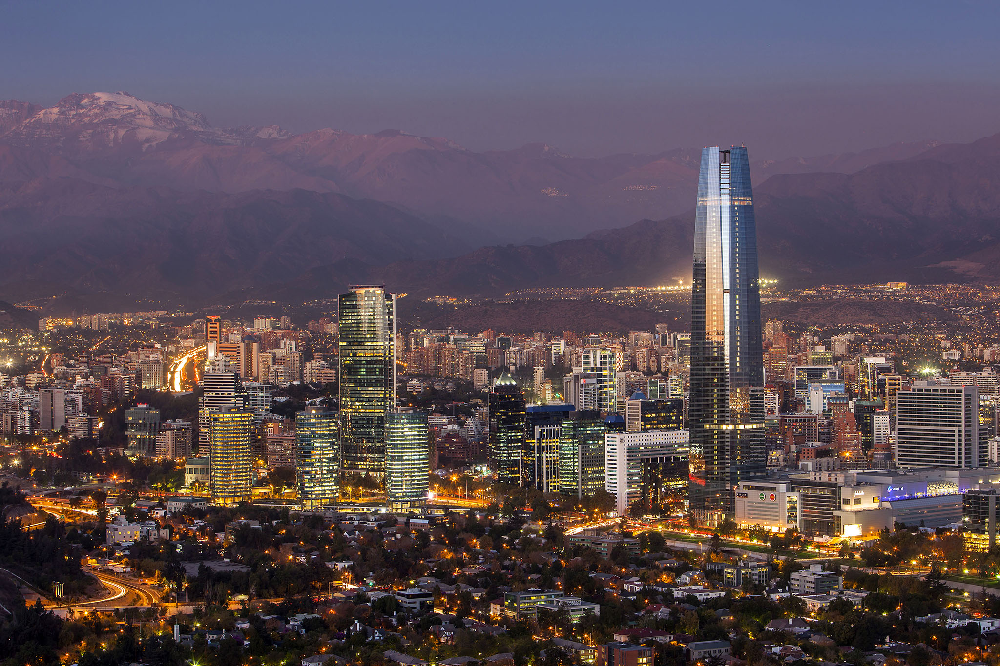

# Estudio por vecindarios

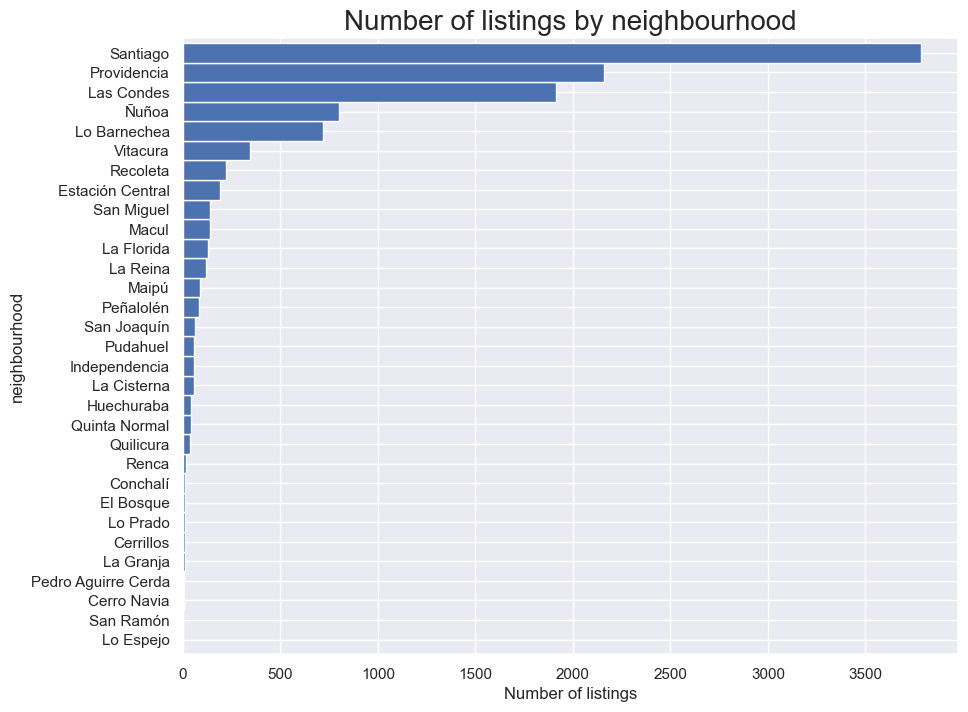

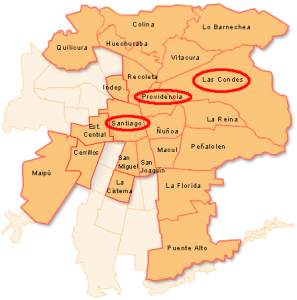

In [16]:
feq=listings['neighbourhood'].value_counts().sort_values(ascending=True)
feq.plot.barh(figsize=(10, 8), color='b', width=1)
plt.title("Number of listings by neighbourhood", fontsize=20)
plt.xlabel('Number of listings', fontsize=12)
plt.show()

from IPython.display import display, Image
image_path=r"C:\Users\34650\Desktop\BOOTCAMP_CURSO\Temario\MODULO 2\PROYECTO MODULO 2\input\Comunas-297x300.png"
display(Image(filename=image_path))

#https://santiagochile.com/staying-comunas-santiago-centro-providencia-las-condes/


In [17]:
#Plotly version 
px.bar(feq, orientation='h', title = "Number of listings by neighbourhood", template= "plotly_dark")

In [18]:
lats2018 = listings['latitude'].tolist()
lons2018 = listings['longitude'].tolist()
locations = list(zip(lats2018, lons2018))

map1 = folium.Map(location=[-70.6482700, -33.4569400], zoom_start=12)
FastMarkerCluster(data=locations).add_to(map1)
map1

# Tipos de propiedades y habitaciones

### Tipos de habitaciones

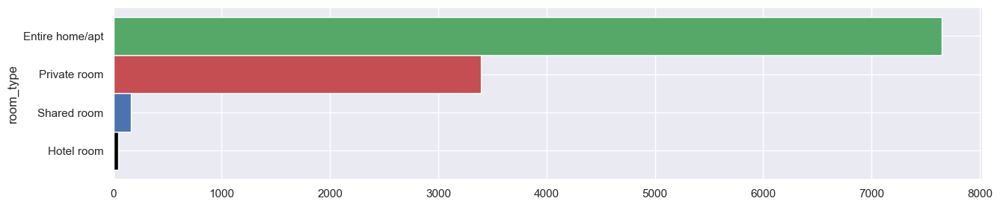

In [19]:
freq = listings['room_type']. value_counts().sort_values(ascending=True)
freq.plot.barh(figsize=(15, 3), width=1, color = ["black","b","r", "g"])
plt.show()

In [20]:
#plotly version
px.histogram(listings,'room_type',nbins = 20,template= "plotly_dark")

### Tipos de propiedades

In [21]:
listings.property_type.unique()

array(['Private room in rental unit', 'Entire rental unit',
       'Private room in home', 'Entire condo', 'Private room in bungalow',
       'Shared room in home', 'Private room in condo',
       'Entire serviced apartment', 'Entire villa', 'Casa particular',
       'Private room in bed and breakfast', 'Entire loft',
       'Room in serviced apartment', 'Entire home',
       'Private room in tower', 'Shared room in rental unit',
       'Entire vacation home', 'Private room',
       'Private room in guest suite', 'Private room in guesthouse',
       'Shared room in hostel', 'Private room in townhouse',
       'Shared room in loft', 'Tiny home', 'Private room in hostel',
       'Entire townhouse', 'Entire cabin', 'Entire place',
       'Room in boutique hotel', 'Private room in serviced apartment',
       'Private room in cabin', 'Entire guesthouse',
       'Private room in farm stay', 'Entire bungalow',
       'Entire guest suite', 'Private room in casa particular',
       'Private roo

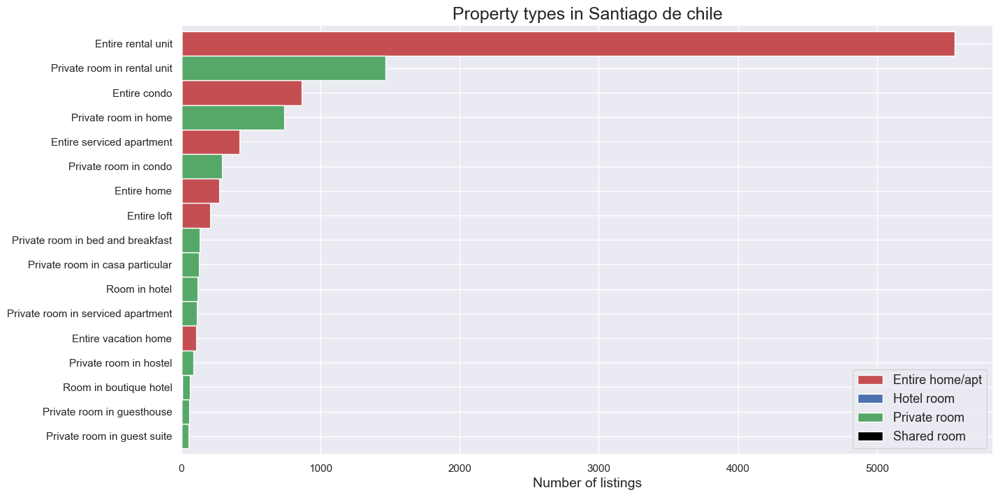

In [22]:
prop = listings.groupby(['property_type','room_type']).room_type.count()
prop = prop.unstack()
prop['total'] = prop.iloc[:,0:3].sum(axis = 1)
prop = prop.sort_values(by=['total'])
prop = prop[prop['total']>=50]
prop = prop.drop(columns=['total'])

prop.plot(kind='barh',stacked=True, color = ["r","b","g","black"],
              linewidth = 1, grid=True, figsize=(15,8), width=1)
plt.title('Property types in Santiago de chile', fontsize=18)
plt.xlabel('Number of listings', fontsize=14)
plt.ylabel("")
plt.legend(loc = 4,prop = {"size" : 13})
plt.rc('ytick', labelsize=13)
plt.show()

In [23]:
fig = px.bar(prop, barmode="group", color_discrete_map={"Entire home/apt": "red", "Private room": "green", "Shared room": "black", "Hotel room":"blue"}, template="plotly_dark")

fig.update_layout(
    legend_title_text="Tipo de Alojamiento",
    legend=dict(x=0.3, y=1.2)  # Ajusta la posición de la leyenda aquí
)

fig.show()

### Número de alojados


Como era de esperar, la mayoría de los listados son para 2 personas.

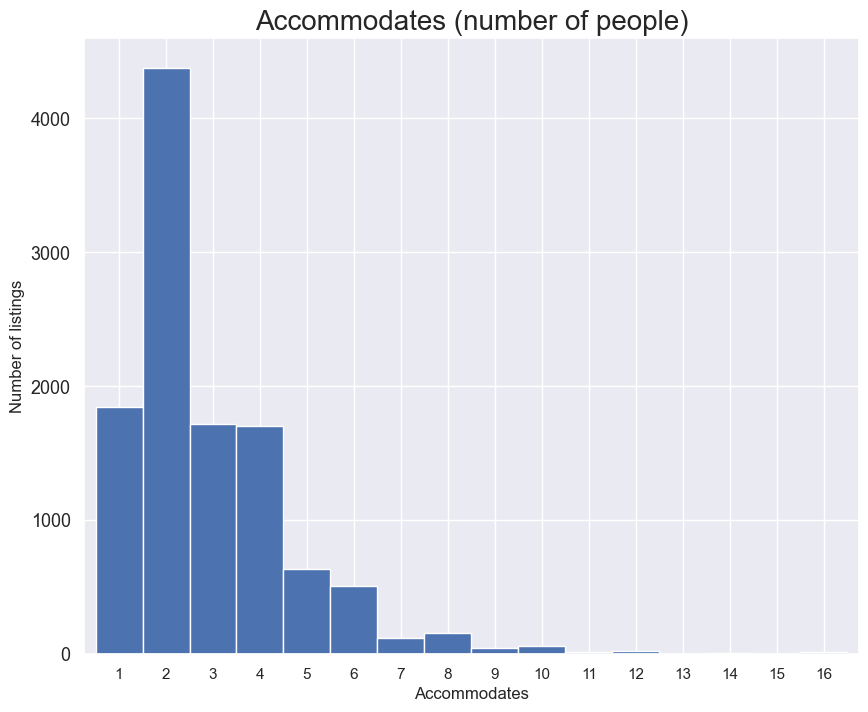

In [24]:
feq=listings['accommodates'].value_counts().sort_index()
feq.plot.bar(figsize=(10, 8), color='b', width=1, rot=0)
plt.title("Accommodates (number of people)", fontsize=20)
plt.ylabel('Number of listings', fontsize=12)
plt.xlabel('Accommodates', fontsize=12)
plt.show()

In [25]:
#Plotly
px.bar(feq,title= "Number of accomodates in Amsterdam",template= "plotly_dark", labels=dict(index="Accomodates",value="Listings"), width = 1000)

### Encontrando algunos hoteles ilegales

In [26]:
privado = listings[listings['room_type'] == "Private room"]
host_private = privado.groupby(['host_id', 'host_name', 'price','calculated_host_listings_count']).size().reset_index(name='private_rooms').sort_values(by=['private_rooms'], ascending=False)
host_private.head()

,host_id,host_name,price,calculated_host_listings_count,private_rooms
3008,514772477,Refugio,99.000,17,10
2033,242357459,Teresita,13.500,9,9
1725,189439813,Departamentos R&M,45.833,40,8
2312,311339792,Parque,60.000,9,8
1319,129429085,Karin,40.000,8,7


Sin embargo, no tenemos las coordenadas GPS de los listados. Pero parece muy probable que todas las habitaciones privadas que ofrece Refugio estén en el mismo sitio . Aunque este anfitrión podría tener alguna licencia  sus listados también parecen sospechosos.

In [27]:
Refugio = privado[privado['host_id']== 514772477]
Refugio = Refugio[['name','host_id', 'host_name', 'latitude', 'longitude','price']]
Refugio.index.name = "listing_id"
Refugio

,name,host_id,host_name,latitude,longitude,price
listing_id,,,,,,
891561783145317753,Home in Los Maitenes Altos · 1 bedroom · 1 bed...,514772477,Refugio,-33.341280,-70.363264,109.0
892256645269222172,Dome in Los Maitenes Altos · 1 bedroom · 1 bed...,514772477,Refugio,-33.340010,-70.364940,120.0
901616678619014694,Hotel in Los Maitenes Altos · 1 bedroom · 2 be...,514772477,Refugio,-33.341230,-70.363380,99.0
914709712227414862,Home in Los Maitenes Altos · 1 bedroom · 1 bed...,514772477,Refugio,-33.341500,-70.363100,109.0
914731538802690384,Home in Los Maitenes Altos · 1 bedroom · 1 bed...,514772477,Refugio,-33.339670,-70.362970,109.0
914745155807146031,Home in Los Maitenes Altos · 1 bedroom · 1 bed...,514772477,Refugio,-33.340020,-70.364690,109.0
914755079788297239,Home in Los Maitenes Altos · 1 bedroom · 1 bed...,514772477,Refugio,-33.339450,-70.363730,109.0
916822023003483992,Hotel in Los Maitenes Altos · 1 bedroom · 2 be...,514772477,Refugio,-33.341100,-70.365120,99.0
916833214134952459,Hotel in Los Maitenes Altos · 1 bedroom · 2 be...,514772477,Refugio,-33.341140,-70.363120,99.0


In [28]:
#Vemos en un mapa las propiedades de Refugio
map2 = folium.Map(location=[-70.6482700, -33.4569400], zoom_start=13)
for coord in Refugio.itertuples(index=False):
    folium.Marker((coord.latitude, coord.longitude), tooltip=coord.name).add_to(map2)
map2

In [29]:
Teresita = privado[privado['host_id']== 242357459]
Teresita = Teresita[['name','host_id', 'host_name', 'latitude', 'longitude','price']]
Teresita.index.name = "listing_id"
Teresita

,name,host_id,host_name,latitude,longitude,price
listing_id,,,,,,
32288212,Guesthouse in Ñuñoa · ★4.81 · 1 bedroom · 1 be...,242357459,Teresita,-33.44630,-70.57993,13.5
35355376,Guest suite in Ñuñoa · 1 bedroom · 1 bed · 2 s...,242357459,Teresita,-33.44723,-70.58078,13.5
35460931,Guesthouse in Ñuñoa · ★4.90 · 1 bedroom · 1 be...,242357459,Teresita,-33.44777,-70.58142,13.5
35718140,Guesthouse in Ñuñoa · ★5.0 · 1 bedroom · 1 bed...,242357459,Teresita,-33.44819,-70.58009,13.5
39856906,Guesthouse in Ñuñoa · ★5.0 · 1 bedroom · 1 bed...,242357459,Teresita,-33.44723,-70.58078,13.5
39204736,Guesthouse in Ñuñoa · ★4.81 · 1 bedroom · 1 be...,242357459,Teresita,-33.44841,-70.58034,13.5
52076130,Guesthouse in Ñuñoa · ★4.92 · 1 bedroom · 1 be...,242357459,Teresita,-33.44787,-70.58155,13.5
750726717940565578,Guest suite in Ñuñoa · ★5.0 · 1 bedroom · 1 be...,242357459,Teresita,-33.44743,-70.57957,13.5
750799949560948358,Guesthouse in Ñuñoa · ★5.0 · 1 bedroom · 1 bed...,242357459,Teresita,-33.44687,-70.58027,13.5


In [30]:
#Vemos en un mapa las propiedades de Refugio
map2 = folium.Map(location=[-70.6482700, -33.4569400], zoom_start=13)
for coord in Teresita.itertuples(index=False):
    folium.Marker((coord.latitude, coord.longitude), tooltip=coord.name).add_to(map2)
map2

### Precio medio por vecindario

Para comparar solo seleccionaremos el tipo de alojamiento más común, que es el alojamiento para 2 personas. Vemos que el alojamiento en el centro de la ciudad no es el más caro. Diriamos que las casas acomodadas para dos personas y las mas caras estarian a las afueras del centro. Por ejemplo 'Pudahuel' o tambien 'Ñuñoa' o 'La barnechea'.

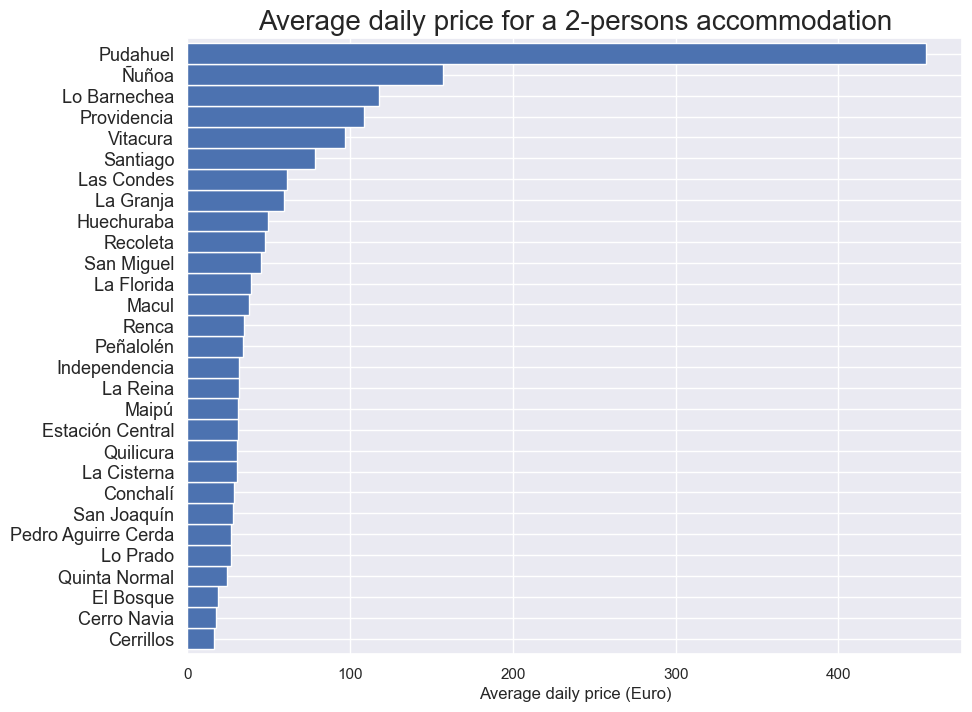

In [31]:
feq = listings[listings['accommodates']==2]
feq = feq.groupby('neighbourhood')['price'].mean().sort_values(ascending=True)
feq.plot.barh(figsize=(10, 8), color='b', width=1)
plt.title("Average daily price for a 2-persons accommodation", fontsize=20)
plt.xlabel('Average daily price (Euro)', fontsize=12)
plt.ylabel("")
plt.show()

A continuación puede encontrar los barrios en un mapa. Este mapa es **interactivo**. Al pasar el cursor sobre los polígonos se muestra el nombre del barrio y el precio medio de los alojamientos para 2 personas.

In [32]:
feq = listings[listings['accommodates']==2]
feq = feq.groupby('neighbourhood')['price'].mean().sort_values(ascending=True)

In [33]:
SC = gpd.read_file(r"C:\Users\34650\Desktop\BOOTCAMP_CURSO\Temario\MODULO 2\PROYECTO MODULO 2\input\neighbourhoods.geojson")

In [34]:

feq = feq.transpose()
# Mezclamos
SC = pd.merge(SC, feq, on='neighbourhood', how='left')

# Renombramos la columna
SC.rename(columns={'price': 'average_price'}, inplace=True)
SC = SC.dropna(subset=['average_price'])

# Redondeamos el precio
SC.average_price = SC.average_price.round(decimals=2)

# Conseguimos colores para nuestras casas 
map_dict = SC.set_index('neighbourhood')['average_price'].to_dict()
color_scale = LinearColormap(['yellow','red'], vmin = min(map_dict.values()), vmax = max(map_dict.values()))

def get_color(feature):
    value = map_dict.get(feature['properties']['neighbourhood'])
    if value is not None:
        return color_scale(value)
    else:
        return 'grey'  # Un color predeterminado si el barrio no está en el diccionario

In [35]:
# Hacemos el mapa
map3 = folium.Map(location=[-70.6482700, -33.4569400], zoom_start=11)
folium.GeoJson(data=SC,
               name='Santiago de chile',
               tooltip=folium.features.GeoJsonTooltip(fields=['neighbourhood', 'average_price'],
                                                      labels=True,
                                                      sticky=True),
               style_function= lambda feature: {
                   'fillColor': get_color(feature),
                   'color': 'black',
                   'weight': 1,
                   'dashArray': '5, 5',
                   'fillOpacity':0.9
                   },
               highlight_function=lambda feature: {'weight':3, 'fillColor': get_color(feature), 'fillOpacity': 0.8}).add_to(map3)
map3

### Seguridad del vecindario (Delitos contra la propiedad)

                                                                                                    




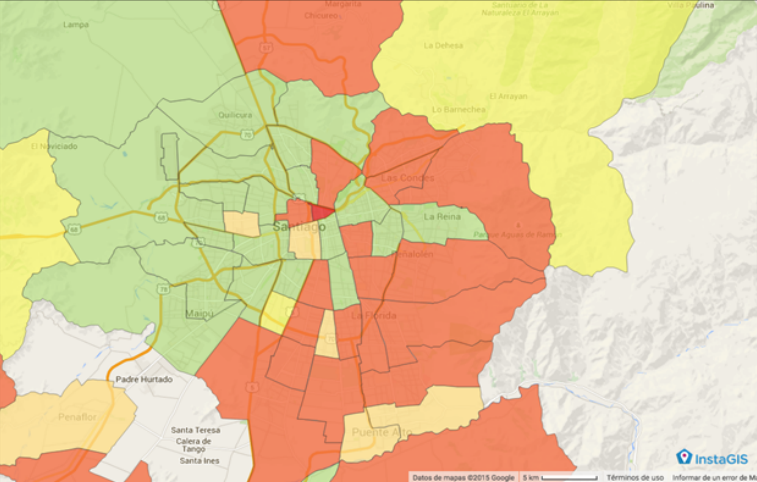                  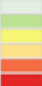          





Este estudio es el resultado de un trabajo mayor realizado en conjunto por InstaGIS (www.instagis.com), la Asociación de Municipalidades de Chile (www.amuch.cl) y el Observatorio de Seguridad 
Municipal (www.observatorioseguridad.cl), con el fin de crear un “Mapa del Delito” a nivel nacional.
                                                                                                      

### Análisis de las reviews

Analizar un poco las reseñas que dejan los huespedes...

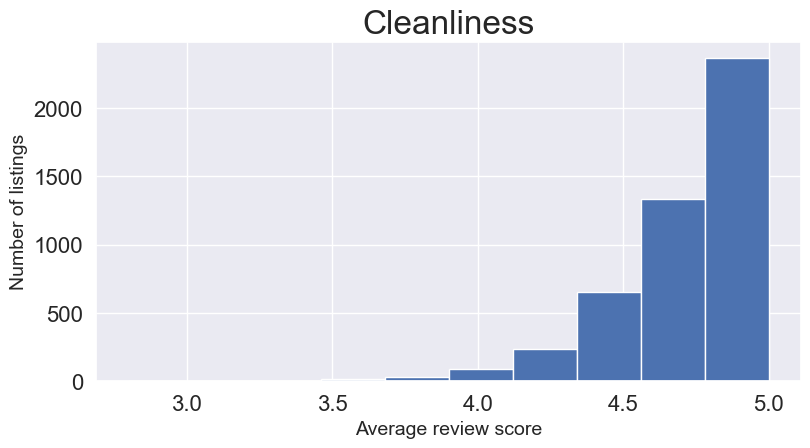

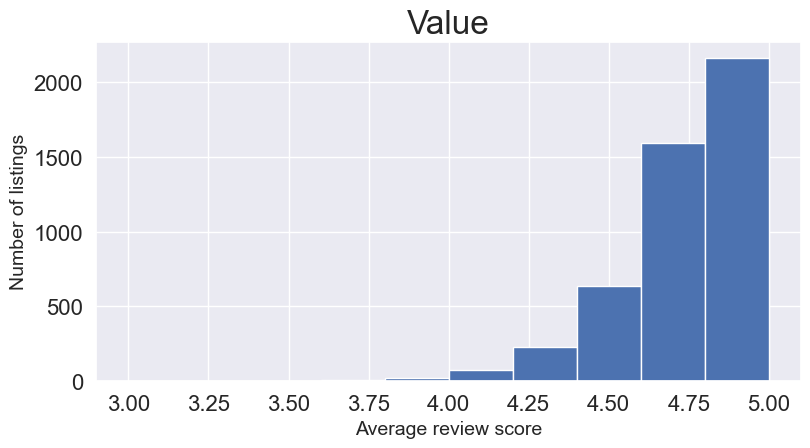

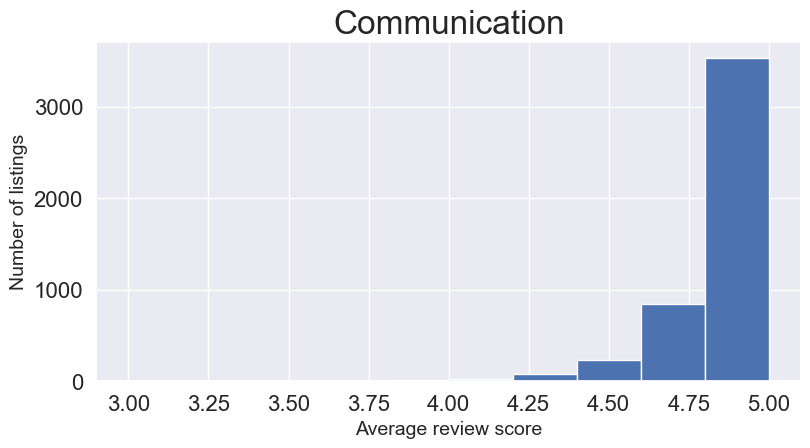

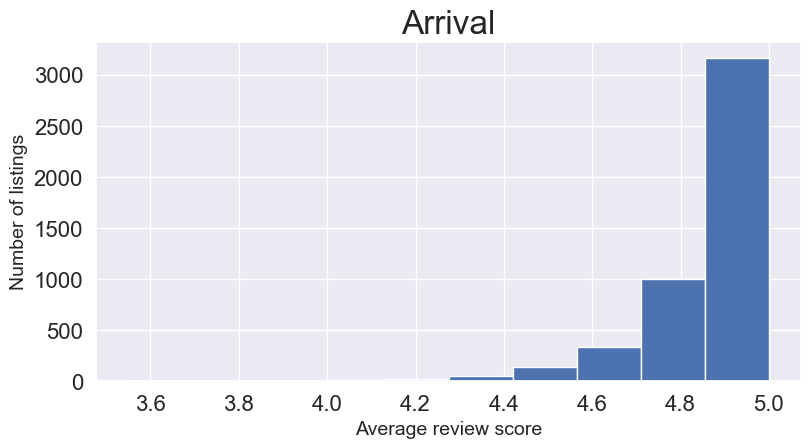

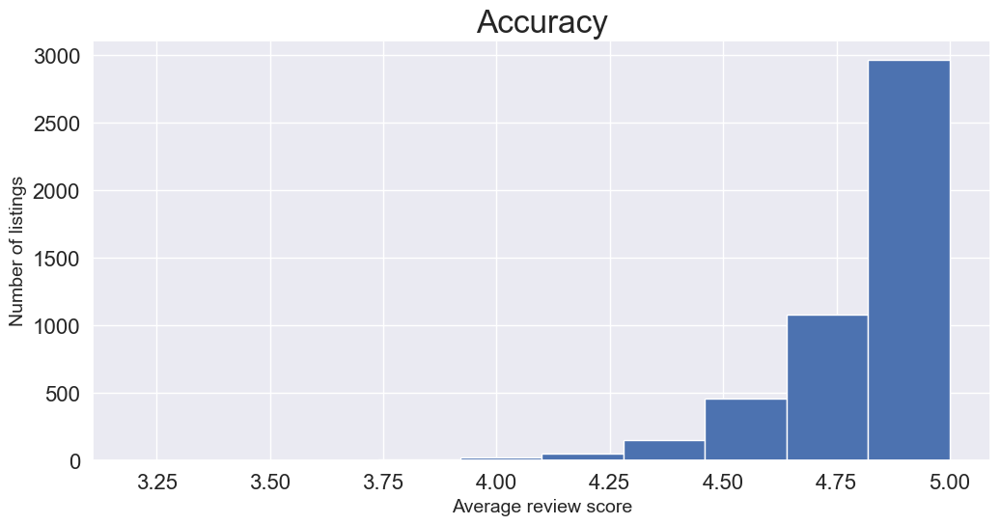

In [36]:
listings10 = listings[listings['number_of_reviews']>=10]

fig = plt.figure(figsize=(20, 15))
plt.rc('xtick', labelsize=16) 
plt.rc('ytick', labelsize=16)

ax2 = fig.add_subplot(322)
listings10['review_scores_cleanliness'].plot.hist(color='b', bins=10)  # Adjust the number of bins
plt.title("Cleanliness", fontsize=24)
plt.ylabel('Number of listings', fontsize=14)
plt.xlabel('Average review score', fontsize=14)

fig = plt.figure(figsize=(20, 15))
plt.rc('xtick', labelsize=16) 
plt.rc('ytick', labelsize=16)

ax3 = fig.add_subplot(323)
listings10['review_scores_value'].plot.hist(color='b', bins=10)  # Adjust the number of bins
plt.title("Value", fontsize=24)
plt.ylabel('Number of listings', fontsize=14)
plt.xlabel('Average review score', fontsize=14)

fig = plt.figure(figsize=(20, 15))
plt.rc('xtick', labelsize=16) 
plt.rc('ytick', labelsize=16)

ax4 = fig.add_subplot(324)
listings10['review_scores_communication'].plot.hist(color='b', bins=10)
plt.title("Communication", fontsize=24)
plt.ylabel('Number of listings', fontsize=14)
plt.xlabel('Average review score', fontsize=14)

fig = plt.figure(figsize=(20, 15))
plt.rc('xtick', labelsize=16) 
plt.rc('ytick', labelsize=16)

ax5 = fig.add_subplot(325)
listings10['review_scores_checkin'].plot.hist(color='b', bins=10)
plt.title("Arrival", fontsize=24)
plt.ylabel('Number of listings', fontsize=14)
plt.xlabel('Average review score', fontsize=14)

fig = plt.figure(figsize=(20, 15))
plt.rc('xtick', labelsize=16) 
plt.rc('ytick', labelsize=16)

ax6 = fig.add_subplot(326)
listings10['review_scores_accuracy'].plot.hist(color='b', bins=10)
plt.title("Accuracy", fontsize=24)
plt.ylabel('Number of listings', fontsize=14)
plt.xlabel('Average review score', fontsize=14)

plt.tight_layout()
plt.show()

Text(0, 0.5, '')

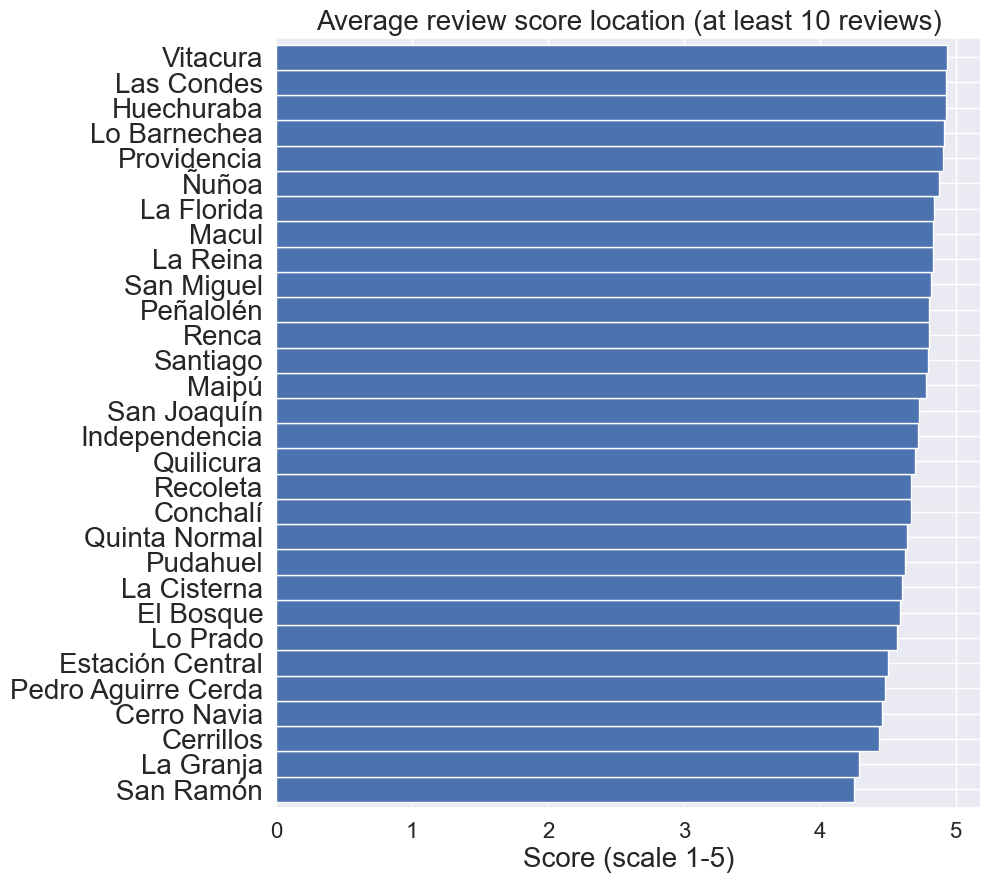

In [37]:
fig = plt.figure(figsize=(20,10))
plt.rc('xtick', labelsize=16)
plt.rc('ytick', labelsize=20)

ax1 = fig.add_subplot(121)
feq = listings[listings['number_of_reviews']>=10]
feq1 = feq.groupby('neighbourhood')['review_scores_location'].mean().sort_values(ascending=True)
ax1=feq1.plot.barh(color='b', width=1)
plt.title("Average review score location (at least 10 reviews)", fontsize=20)
plt.xlabel('Score (scale 1-5)', fontsize=20)
plt.ylabel("")

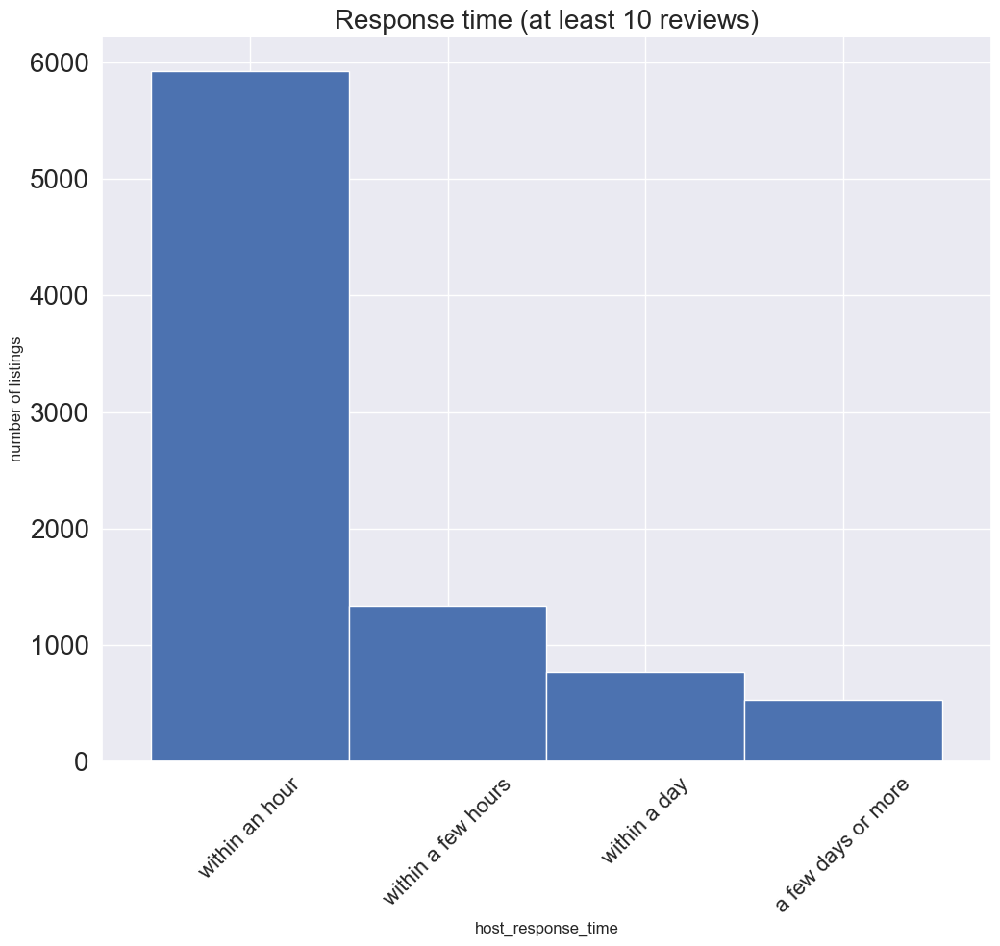

In [38]:
fig = plt.figure(figsize=(20,10))
plt.rc('xtick', labelsize=16)
plt.rc('ytick', labelsize=20) 

ax2 = fig.add_subplot(122)
feq2 = listings['host_response_time'].value_counts()
ax2=feq2.plot.bar(color='b', width=1, rot=45)
plt.title("Response time (at least 10 reviews)", fontsize=20)
plt.ylabel("number of listings")

plt.tight_layout()
plt.show()

### Valoracion sobre los superhost

In [39]:
freq = listings.groupby(['host_id']).size().reset_index(name='num_host_listings')
host_prop = freq.groupby(['num_host_listings']).size().reset_index(name='count').transpose()
host_prop.columns = host_prop.iloc[0]
host_prop = host_prop.drop(host_prop.index[0])
host_prop

num_host_listings,1,2,3,4,5,6,7,8,9,10,...,24,28,29,30,32,34,40,47,48,80
count,5849,754,249,117,82,44,40,14,22,22,...,2,1,1,2,1,1,1,1,1,1


In [40]:
malvados = freq[freq['num_host_listings']>=20] 
px.pie(malvados,'num_host_listings',title = 'Hosts with more than 20 listings',template= "plotly_dark")

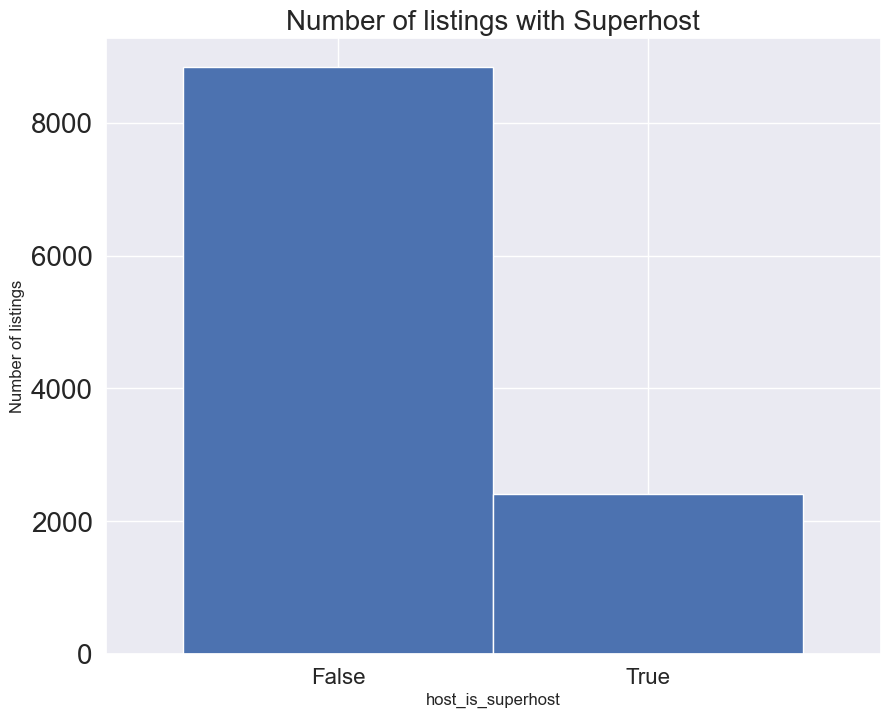

In [41]:
#listings.host_is_superhost = listings.host_is_superhost.replace({"t": "True", "f": "False"})
listings_details['host_is_superhost'] = listings_details['host_is_superhost'].apply(lambda x: "True" if x == "t" else "False")
feq=listings_details['host_is_superhost'].value_counts()
feq.plot.bar(figsize=(10, 8), width=1, rot=0)
plt.title("Number of listings with Superhost", fontsize=20)
plt.ylabel('Number of listings', fontsize=12)
plt.show()

In [42]:
#plotly pie
px.pie(feq ,names = feq.index, values=feq.values,width = 1000, template= "plotly_dark", title="Number of listings with Superhost")

Si tuviéramos que reservar alojamiento, no buscaríamos necesariamente un superhost. En realidad, me temo que pagaría demasiado, ya que el superhost probablemente aumentará sus precios. Sin embargo, tampoco me gustaría un host que responde mal o cancela mucho.

### Disponibilidad en el tiempo

A continuación, veremos que hasta tres meses por delante, generalmente hay más alojamientos disponibles que en el futuro. Las razones de esto pueden ser que los anfitriones están actualizando más activamente sus calendarios en este período de tiempo

In [43]:
sum_available = calendar[calendar.available == "t"].groupby(['date']).size().to_frame(name= 'available').reset_index()
sum_available['weekday'] = sum_available['date'].dt.day_name()
sum_available = sum_available.set_index('date')

In [44]:
sum_available.iplot(y='available', xTitle = 'Date', yTitle = 'number of listings available',\
                   text='weekday', title = 'Number of listings available by date')

### Precio medio por día

In [45]:
average_price = calendar[(calendar['available'] == "t")|(calendar['available'] == "f")] .groupby(['date'])['price'].mean().reset_index()

In [46]:
average_price['weekday'] = average_price['date'].dt.day_name()
average_price = average_price.set_index('date')

In [47]:
average_price.iplot(y='price', mode='lines', xTitle='Date', yTitle='Price',
    text='weekday', title='Average price of available 2 persons accommodation by date')

# Minería de texto con las _reviews_

In [48]:
reviews_details = reviews_details.join(listings[['host_id', 'host_name', 'name']], on="listing_id", how="left")

In [49]:
reviews_details = reviews_details.set_index('id')
reviews_details = reviews_details[['listing_id', 'name', 'host_id', 'host_name', 'date', 'reviewer_id', 'reviewer_name', 'comments']]
reviews_details.head()

,listing_id,name,host_id,host_name,date,reviewer_id,reviewer_name,comments
id,,,,,,,,
138055,52811,Rental unit in Providencia · ★4.42 · 1 bedroom...,244792,Cristián,2010-11-13,18583,John,"Cristian's a great host, and the apartment was..."
207757,52811,Rental unit in Providencia · ★4.42 · 1 bedroom...,244792,Cristián,2011-03-23,379370,Gordon,Excellent accommodation and location. Couldn't...
877546,52811,Rental unit in Providencia · ★4.42 · 1 bedroom...,244792,Cristián,2012-01-23,555663,Rasha,Cristian's apartment was a fantastic spot for ...
1069452,52811,Rental unit in Providencia · ★4.42 · 1 bedroom...,244792,Cristián,2012-04-01,1608237,Melissa,Brilliant location right on top of Manuel Mont...
2052452,52811,Rental unit in Providencia · ★4.42 · 1 bedroom...,244792,Cristián,2012-08-21,2505878,Greg,"This is an amazing apartment, and a great loca..."


In [50]:
host_reviews = reviews_details.groupby(['host_id', 'host_name']).size().sort_values(ascending=False).to_frame(name = "number_of_reviews")
host_reviews.head()

,,number_of_reviews
host_id,host_name,
1645230,Brian,3520
184993297,America,3255
39185761,Mariana & Dominic,2352
10177065,Nicolas,2142
175513927,Victoria,2064


In [51]:
reviews_details.comments.values[10]

'Todo acorde a lo prometido, el departamento es cómodo y está muy bien equipado. En una zona segura, céntrica y práctica (cerca del Metro Manuel Montt). La terraza regala una vista memorable y tiene una hermosa piscina (que no tuvimos la suerte de disfrutar debido a la época del año en que visitamos la ciudad) Aunque nunca llegamos a conocernos personalmente, Cristian es un anfitrión cortés y atento.'

In [52]:
import nltk
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\34650\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [53]:
#take out empty comments (530)
reviews_details = reviews_details[reviews_details['comments'].notnull()]

#remove numbers
reviews_details['comments'] = reviews_details['comments'].str.replace('\d+', '') 
#all to lowercase
reviews_details['comments'] = reviews_details['comments'].str.lower()
#remove windows new line
reviews_details['comments'] = reviews_details['comments'].str.replace('\r\n', "")
#remove stopwords (from nltk library)
stop_spanish = stopwords.words("spanish")
reviews_details['comments'] = reviews_details['comments'].apply(lambda x: " ".join([i for i in x.split() 
                                                      if i not in (stop_spanish)]))
# remove punctuation
reviews_details['comments'] = reviews_details['comments'].str.replace('[^\w\s]'," ")
# replace x spaces by one space
reviews_details['comments'] = reviews_details['comments'].str.replace('\s+', ' ')

reviews_details.comments.values[10] #print same comments again

'acorde prometido, departamento cómodo bien equipado. zona segura, céntrica práctica (cerca metro manuel montt). terraza regala vista memorable hermosa piscina (que suerte disfrutar debido época año visitamos ciudad) aunque nunca llegamos conocernos personalmente, cristian anfitrión cortés atento.'

In [54]:
texts = reviews_details.comments.tolist()

vec = CountVectorizer().fit(texts)
bag_of_words = vec.transform(texts)
sum_words = bag_of_words.sum(axis=0)
words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]

cvec_df = pd.DataFrame.from_records(words_freq, columns= ['words', 'counts']).sort_values(by="counts", ascending=False)
cvec_df.head(10)

KeyboardInterrupt: 

In [ ]:
cvec_dict = dict(zip(cvec_df.words, cvec_df.counts))

wordcloud = WordCloud(width=800, height=400)
wordcloud.generate_from_frequencies(frequencies=cvec_dict)
plt.figure( figsize=(20,10) )
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()




![La buena chile.png](<attachment:La buena chile.png>)
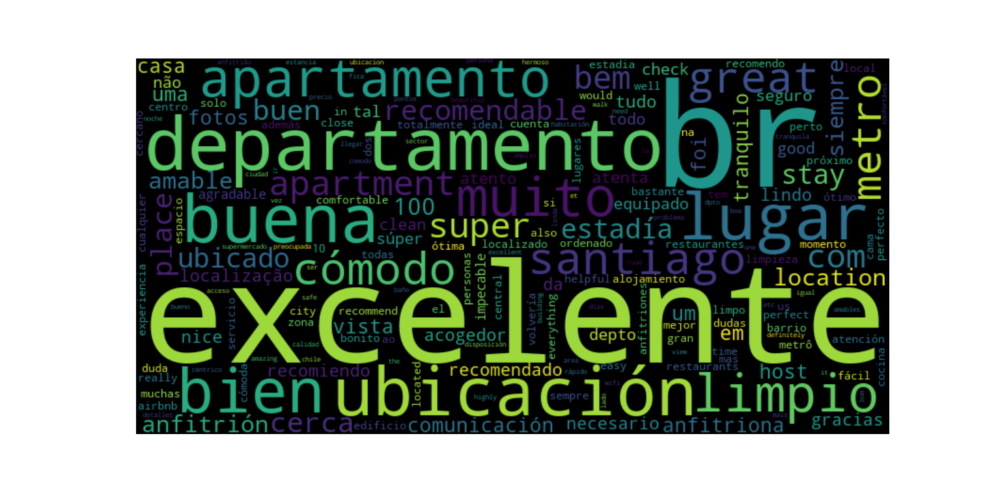